# Convolutions

In mathematics (and, in particular, functional analysis)
[convolution](https://en.wikipedia.org/wiki/Convolution)  is a mathematical operation on two functions ($f$
and $g$) to produce a third function, that is typically viewed as a
modified version of one of the original functions, giving the integral
of the pointwise multiplication of the two functions as a function of
the amount that one of the original functions is translated.

![convolution](http://nikbearbrown.com/YouTube/MachineLearning/IMG/Comparison_convolution_correlation.svg.png)

Convolution is similar to cross-correlation. For discrete real valued
signals, they differ only in a time reversal in one of the signals. For
continuous signals, the cross-correlation operator is the adjoint
operator of the convolution operator.

It has applications that include probability, statistics, computer
vision, natural language processing, image and signal processing,
engineering, and differential equations.

The convolution can be defined for functions on groups other than
Euclidean space. For example, periodic functions, such as the
discrete-time Fourier transform, can be defined on a circle and
convolved by *periodic convolution*. A *discrete convolution* can be defined for functions on
the set of integers.

Generalizations of convolution have applications in the field of
numerical analysis and numerical linear algebra, and in the design
and implementation of finite impulse response filters in signal
processing.

Computing the inverse of the convolution operation is known as
_deconvolution_.


### Definition  


The convolution of $f$ and $g$ is written $f∗g$, using an asterisk
or star. It is defined as the integral of the product of the two
functions after one is reversed and shifted. As such, it is a particular
kind of integral transform:


$$
\begin{align}
(f * g )(t) & \, \stackrel{\mathrm{def}}{=}\ \int_{-\infty}^\infty f(\tau) g(t - \tau) \, d\tau \\
& = \int_{-\infty}^\infty f(t-\tau) g(\tau)\, d\tau.
\end{align}
$$

While the symbol $t$ is used above, it need not represent the time
domain. But in that context, the convolution formula can be described as
a weighted average of the function $f*(\tau)$ at the moment $t$ where the
weighting is given by $g(−\tau)$ simply shifted by amount $t$. As $t$
changes, the weighting function emphasizes different parts of the input
function.

For functions $f$, $g$ supported on only $0, \infty$ (i.e., zero for
negative arguments), the integration limits can be truncated, resulting
in

$$
(f * g )(t) = \int_{0}^{t} f(\tau) g(t - \tau)\, d\tau \text{ for } f, g : 0, \infty \to \mathbb{R}
$$

In this case, the Laplace transform is more appropriate than the
Fourier transform below and boundary terms become relevant.



### Visual explanation

**Example A**

![Visual explanation A](http://nikbearbrown.com/YouTube/MachineLearning/IMG/799px-Convolution3.svg.png)


1.  Express each function in terms of a dummy variable $\tau.$   
2.  Reflect one of the functions: $g(\tau)$→$g(-\tau).$  
3.  Add a time-offset, *t*, which allows $g(t-\tau)$ to slide along the
    $\tau$-axis.  
4.  Start *t* at −∞ and slide it all the way to +∞. Wherever the two
    functions intersect, find the integral of their product. In other
    words, compute a <u>sliding</u>, weighted-sum of function $f(\tau)$,
    where the weighting function is $g(-\tau).$  

**Example B**

![Visual explanation B](http://nikbearbrown.com/YouTube/MachineLearning/IMG/Convolution_of_box_signal_with_itself2.gif)


   In this example, the red-colored \"pulse\", $g(\tau),$ is an even
    function $(\ g(-\tau)=g(\tau)\ ),$ so convolution is equivalent to
    correlation. A snapshot of this \"movie\" shows functions
    $g(t-\tau)$ and $f(\tau)$ (in blue) for some value of parameter $t,$
    which is arbitrarily defined as the distance from the $\tau=0$ axis
    to the center of the red pulse. The amount of yellow is the area of
    the product $f(\tau)\cdot g(t-\tau),$ computed by the
    convolution/correlation integral. The movie is created by
    continuously changing $t$ and recomputing the integral. The result
    (shown in black) is a function of $t,$ but is plotted on the same
    axis as $\tau,$ for convenience and comparison.

**Example C**

![Visual explanation C](http://nikbearbrown.com/YouTube/MachineLearning/IMG/Convolution_of_spiky_function_with_box2.gif)


   In this depiction, $f(\tau)$ could represent the response of an RC
    circuit to a narrow pulse that occurs at $\tau=0.$ In other words,
    if $g(\tau)=\delta(\tau),$ the result of convolution is just $f(t).$
    But when $g(\tau)$ is the wider pulse (in red), the response is a
    \"smeared\" version of $f(t).$ It begins at $t=-0.5,$ because we
    defined $t$ as the distance from the $\tau=0$ axis to the
    <u>center</u> of the wide pulse (instead of the leading edge).



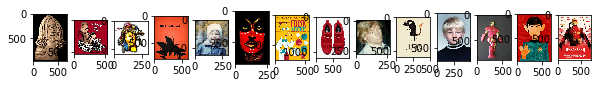

In [94]:
# Bring in python image analysis libraries
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage import color
import skimage.filters as filters
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage import feature
from skimage import morphology
from skimage.draw import circle_perimeter
from skimage import img_as_float, img_as_ubyte
from skimage import segmentation as seg
from skimage.morphology import watershed
from scipy import ndimage as nd
from scipy.ndimage import convolve
from skimage import feature
import glob # for bulk file import

# Set defaults
plt.rcParams['image.cmap'] = 'gray' # Display grayscale images in... grayscale.
plt.rcParams['image.interpolation'] = 'none' # Use nearest-neighbour
plt.rcParams['figure.figsize'] = 10, 10

# Import test images
imgpaths = glob.glob("./images/*.jpg") + glob.glob("./images/*.png")
# imgpaths = glob.glob("img/*.jpg") + glob.glob("img/*.png")  Windows
# Windows has different relative paths than Mac/Unix
imgset = [mpimg.imread(x) for x in imgpaths]

# Display thumbnails of the images to make sure they loaded
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

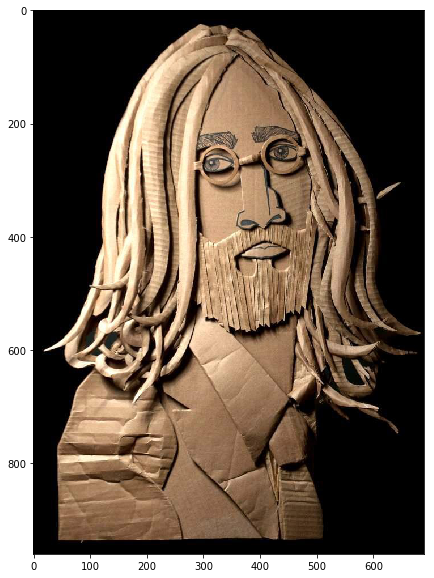

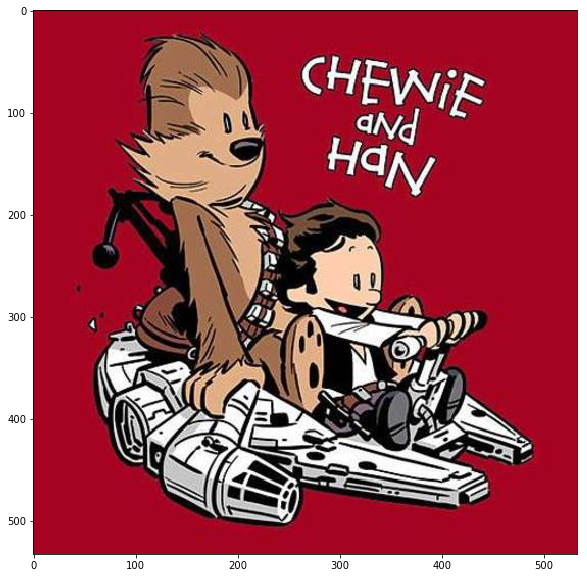

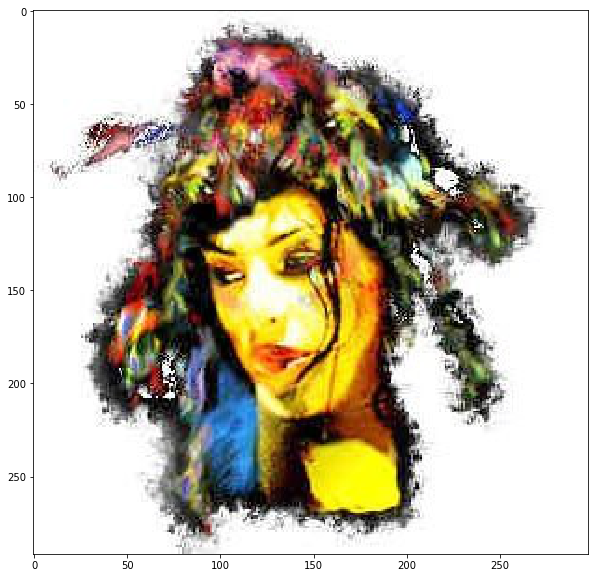

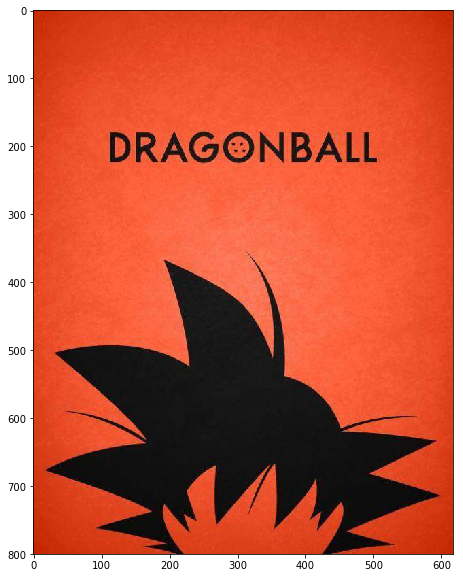

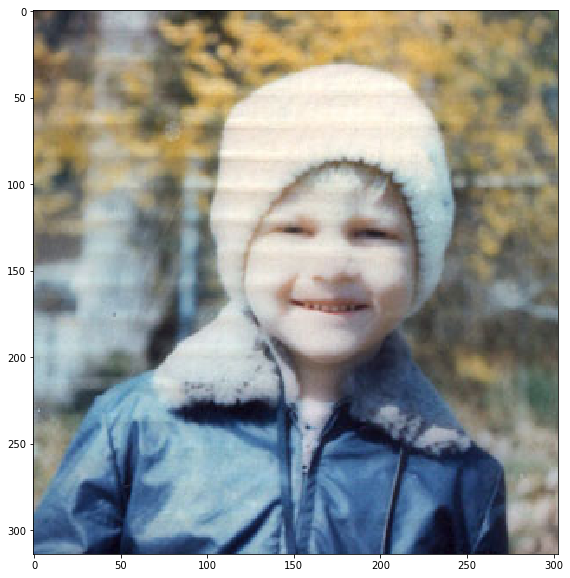

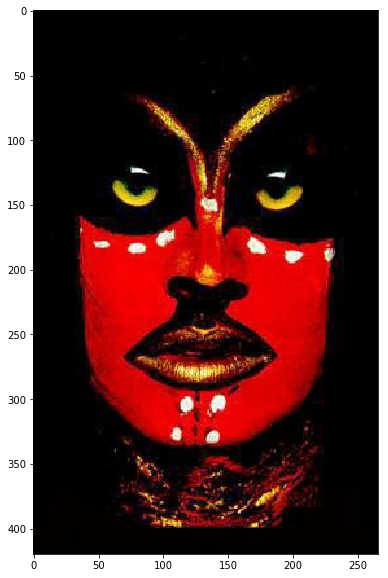

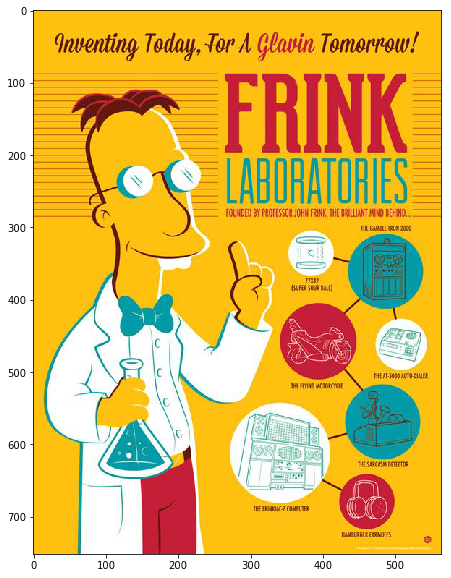

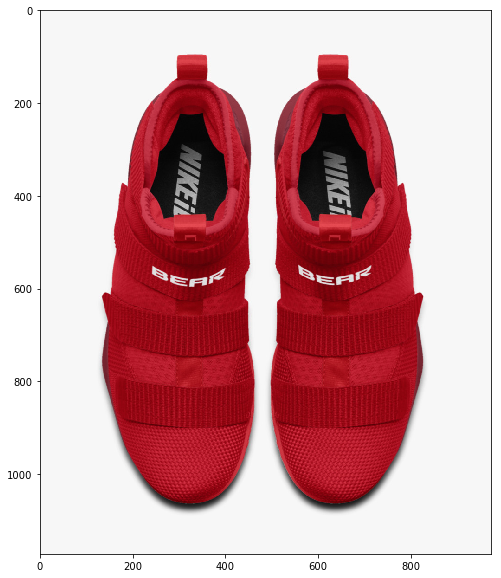

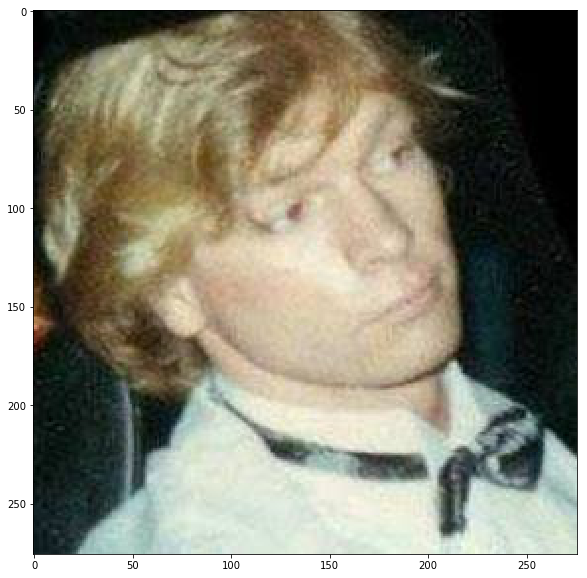

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


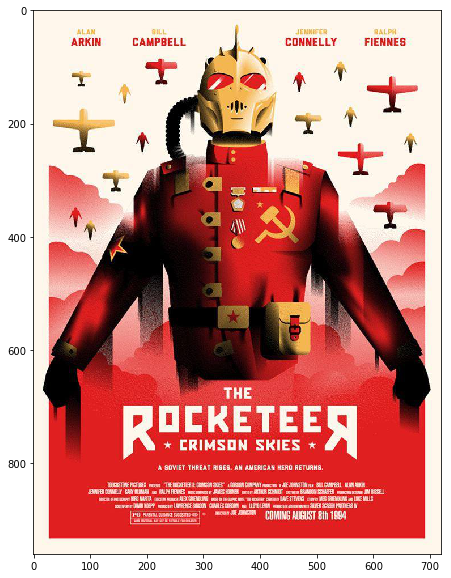

In [95]:
for i,img in enumerate(imgset):
    plt.figure()
    plt.imshow(img)

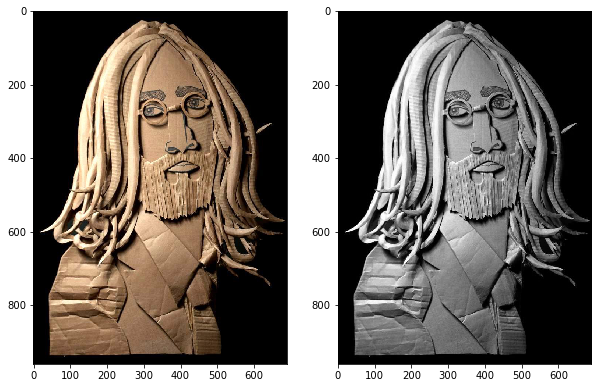

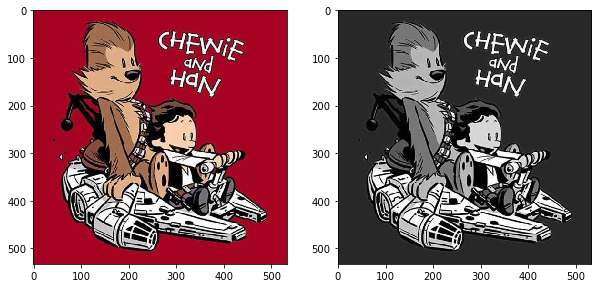

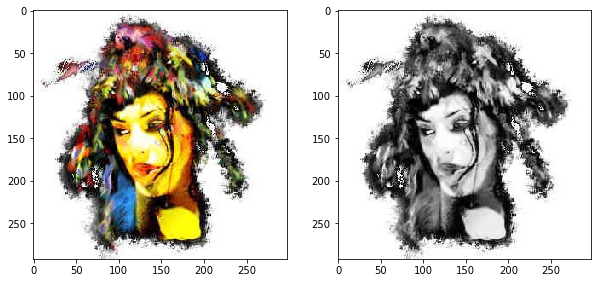

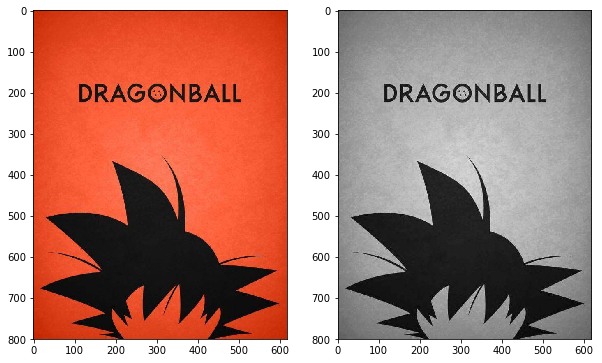

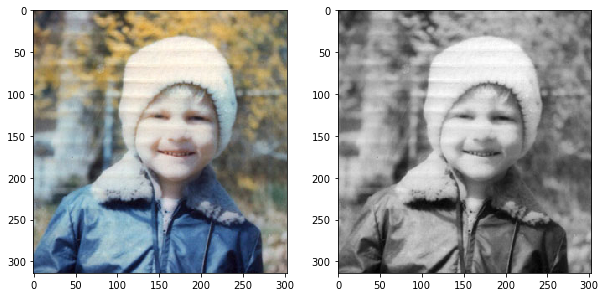

...

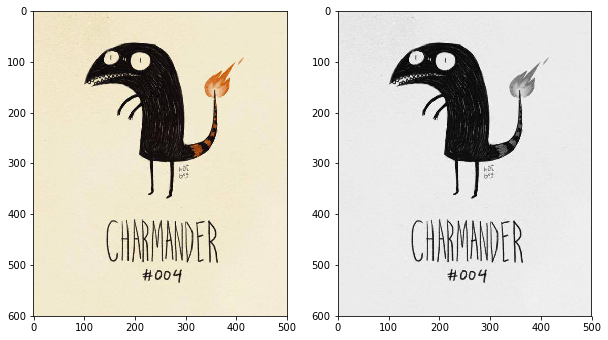

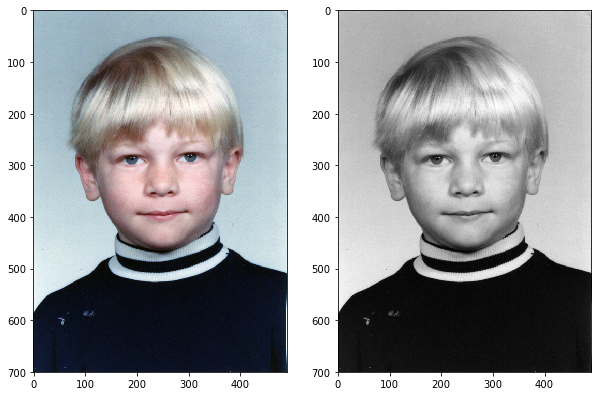

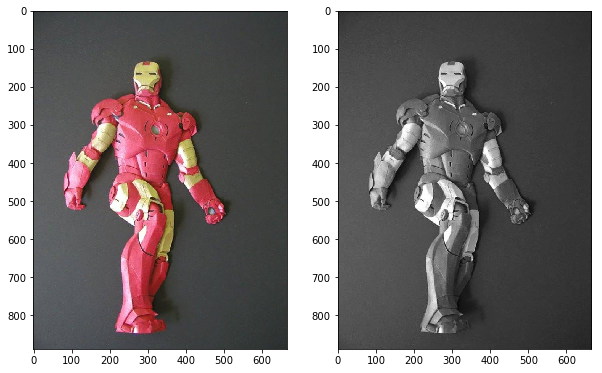

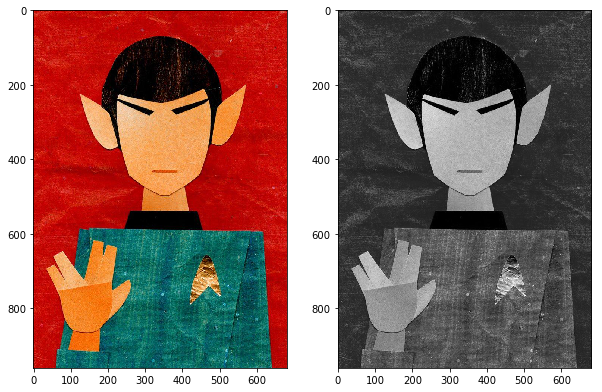

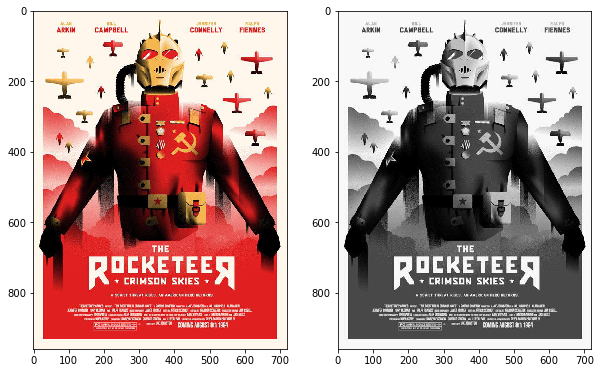

In [96]:
for i,img in enumerate(imgset):
    img_bw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1) # One row, two columns, image 1
    plt.imshow(img)
    plt.subplot(1, 2, 2)  # One row, two columns, image 2
    plt.imshow(img_bw)

## Simple Edge Detection

A simple edge detection algorithm would look for edges where there is the greatest difference amongst pixels and their neighbors. Let's try it. 


In [97]:
# Find horizontal edges using a simple shifting method
def find_horizontal_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[:, 1:] - imgbw[:, :-1])

# Find vertical edges using a simple shifting method
def find_vertical_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[1:, :] - imgbw[:-1, :])

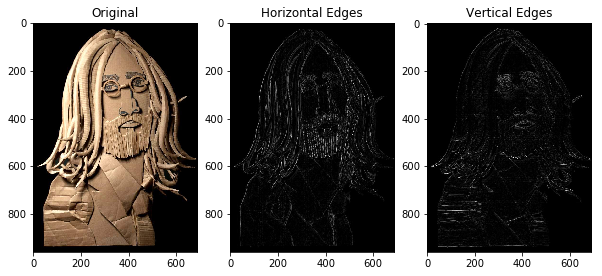

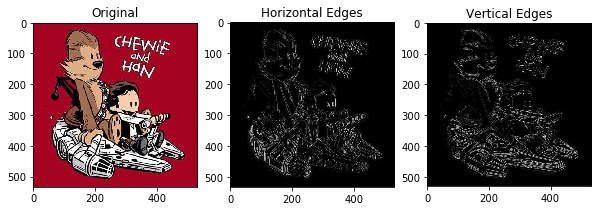

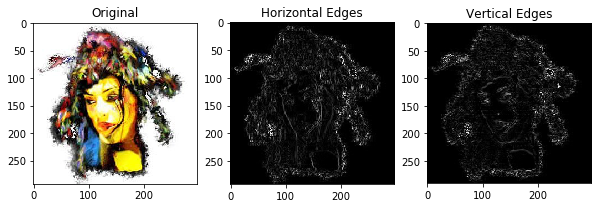

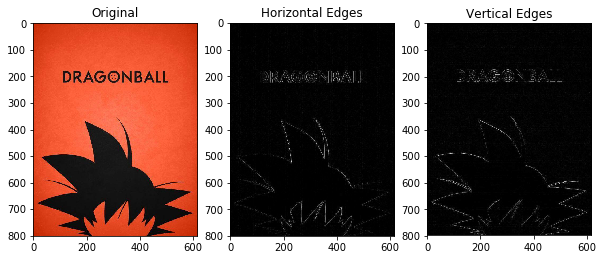

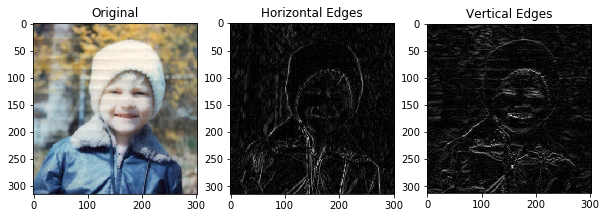

...

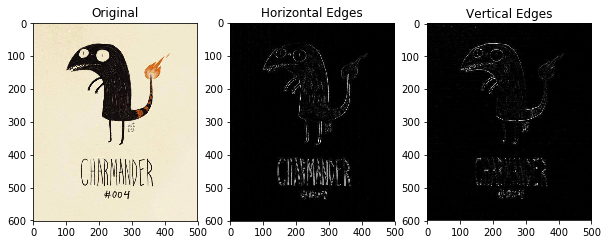

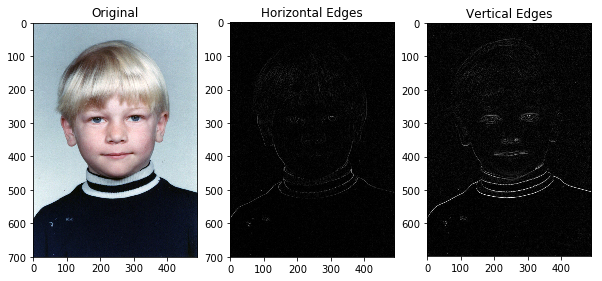

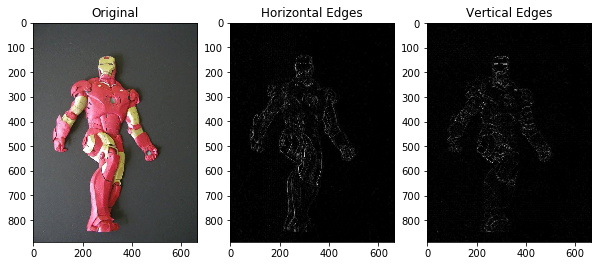

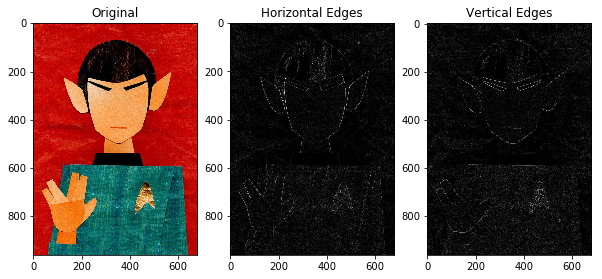

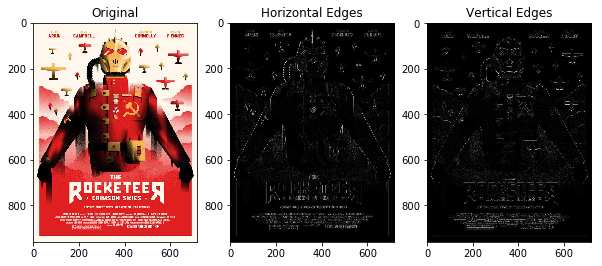

In [98]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(img)
    plt.subplot(1, 3, 2)
    plt.title('Horizontal Edges')
    plt.imshow(find_horizontal_edges(img))
    plt.subplot(1, 3, 3)
    plt.title('Vertical Edges')
    plt.imshow(find_vertical_edges(img))

## Downsample

In [99]:
# Downsample an image by skipping indicies
def downsample_image(img, skip):
     return img[::skip,::skip]

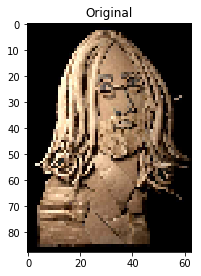

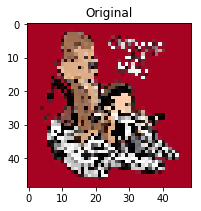

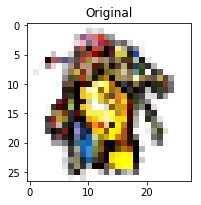

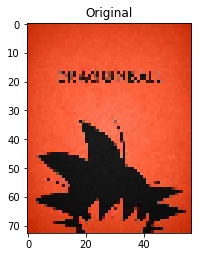

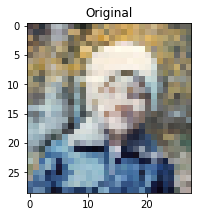

...

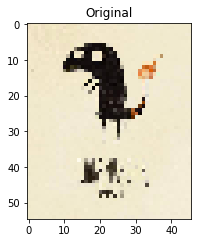

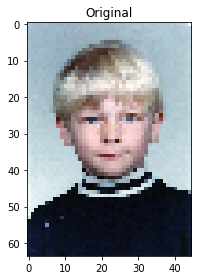

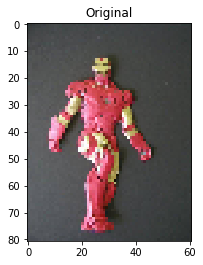

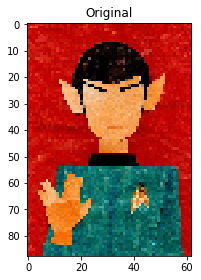

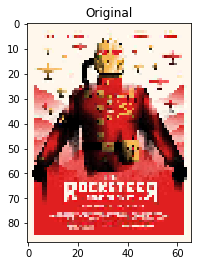

In [100]:
# Apply to image set
for i,img in enumerate(imgset):
    img = downsample_image(img, 11) # downsample    
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(img)

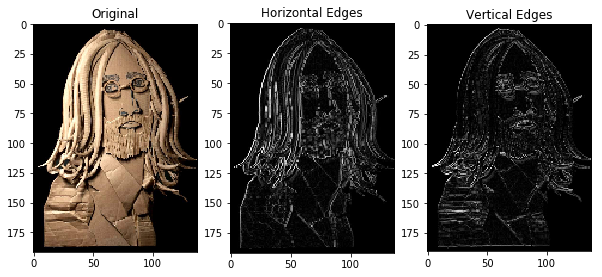

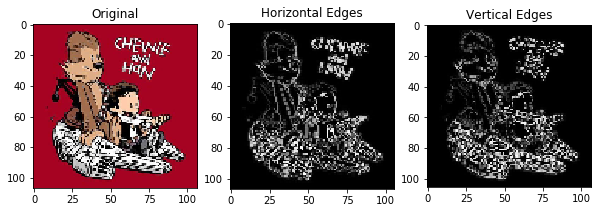

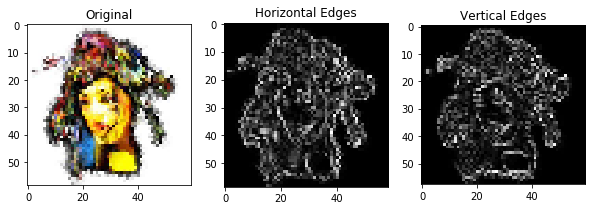

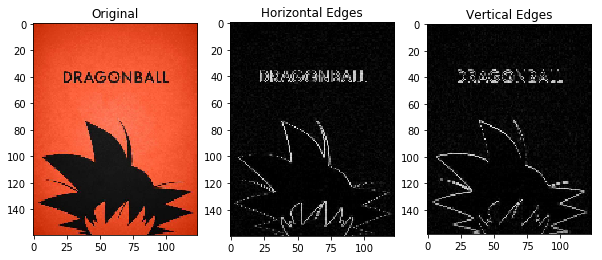

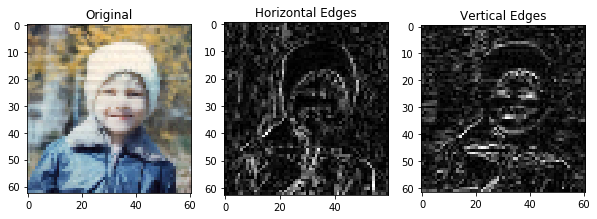

...

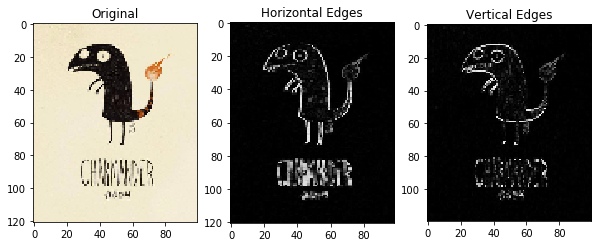

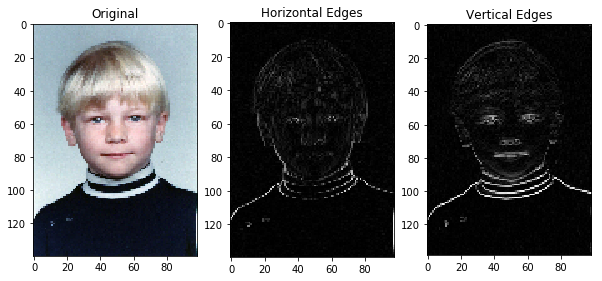

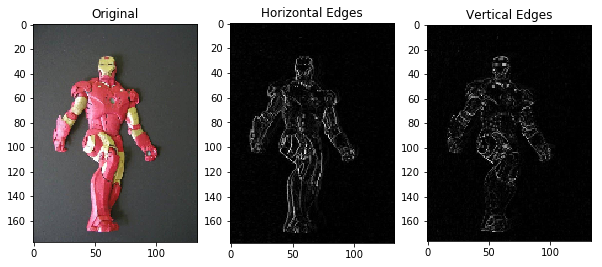

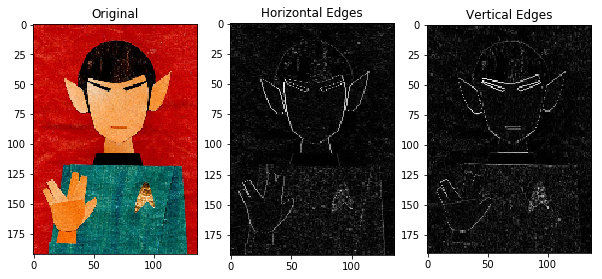

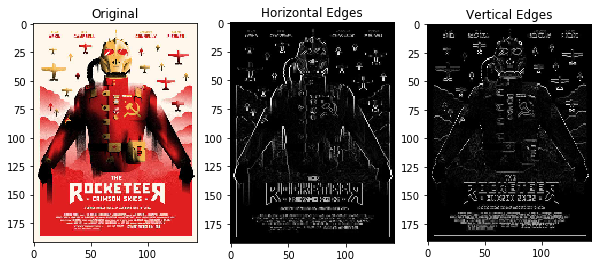

In [101]:
# Apply to image set
for i,img in enumerate(imgset):
    img = downsample_image(img, 5) # downsample    
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(img)
    plt.subplot(1, 3, 2)
    plt.title('Horizontal Edges')
    plt.imshow(find_horizontal_edges(img))
    plt.subplot(1, 3, 3)
    plt.title('Vertical Edges')
    plt.imshow(find_vertical_edges(img))

Last update October 3, 2017

The text is released under the [CC-BY-NC-ND license](https://creativecommons.org/licenses/by-nc-nd/3.0/us/legalcode), and code is released under the [MIT license](https://opensource.org/licenses/MIT).